In [1]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt

In [2]:
!kaggle datasets download -d mbkinaci/fruit-images-for-object-detection

Dataset URL: https://www.kaggle.com/datasets/mbkinaci/fruit-images-for-object-detection
License(s): CC0-1.0
 95% 27.0M/28.4M [00:02<00:00, 21.2MB/s]
100% 28.4M/28.4M [00:02<00:00, 12.3MB/s]


In [3]:
# Unzip the dataset
import zipfile
with zipfile.ZipFile('fruit-images-for-object-detection.zip', 'r') as zip_ref:
    zip_ref.extractall('dataset_directory')

## Faster R-CNN Model:

In [5]:
#!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

import os
import torch
import xml.etree.ElementTree as ET
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import numpy as np

class ImageXMLDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        # Get list of all images in the directory
        self.image_files = [f for f in os.listdir(root_dir) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image
        img_name = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGBA')

        # Load XML annotation file
        xml_name = os.path.splitext(img_name)[0] + '.xml'
        annotation = self.parse_xml(xml_name)

        if self.transform:
            image = self.transform(image)

        return image, annotation

    def parse_xml(self, xml_file):
        tree = ET.parse(xml_file)
        root = tree.getroot()

        # Extract information from XML (assuming format, modify as needed)
        boxes = []
        labels = []
        for obj in root.findall('object'):
            label = obj.find('name').text
            labels.append(label)

            # Example assuming XML structure includes bounding box coordinates
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)
            boxes.append([xmin, ymin, xmax, ymax])

        # Pad boxes to ensure consistent dimensions
        max_boxes = 10 # Maximum number of boxes per image - adjust as needed
        if len(boxes) < max_boxes:
            boxes = boxes + [[0, 0, 0, 0]] * (max_boxes - len(boxes))
        boxes = boxes[:max_boxes] # Trim if exceeding max_boxes

        return {"boxes": torch.tensor(boxes, dtype=torch.float32), "labels": labels}

# ... (Rest of the code remains the same) ...

# Custom collate function to handle variable-length bounding boxes
def collate_fn(batch):
    images = [item[0] for item in batch]
    annotations = [item[1] for item in batch]

    # Stack images
    images = torch.stack(images, dim=0)

    # Pad and stack boxes and labels
    max_boxes = max(len(annot['boxes']) for annot in annotations)

    padded_boxes = []
    padded_labels = []
    for annot in annotations:
        num_boxes = len(annot['boxes'])

        # Pad boxes with zeros
        boxes_padded = torch.cat([annot['boxes'], torch.zeros(max_boxes - num_boxes, 4)], dim=0)
        padded_boxes.append(boxes_padded)

        # Pad labels with a placeholder (e.g., "background" or a specific label)
        labels_padded = annot['labels'] + ['background'] * (max_boxes - num_boxes)
        padded_labels.append(labels_padded)

    # Stack padded boxes and labels
    padded_boxes = torch.stack(padded_boxes, dim=0)

    return images, {"boxes": padded_boxes, "labels": padded_labels}



In [6]:
# Define the data transformation (you may adjust this as needed)
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x[:3, :, :])
])

# Define the root directory and specify subdirectories for train and test
root_dir = '/content/dataset_directory'  # Replace with the path to your dataset
train_dir = os.path.join(root_dir, 'train_zip/train')
test_dir = os.path.join(root_dir, 'test_zip/test')

# Initialize datasets for training and testing
train_dataset = ImageXMLDataset(root_dir=train_dir, transform=transform)
test_dataset = ImageXMLDataset(root_dir=test_dir, transform=transform)


train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=2, collate_fn=collate_fn)


In [7]:
# Training loop
for images, annotations in train_dataloader:
    print("Training batch - Images shape:", images.shape)
    print("Training batch - Annotations:", annotations)
    # Insert training code here

# Testing loop
for images, annotations in test_dataloader:
    print("Testing batch - Images shape:", images.shape)
    print("Testing batch - Annotations:", annotations)
    # Insert testing code here


Training batch - Images shape: torch.Size([4, 3, 256, 256])
Training batch - Annotations: {'boxes': tensor([[[3.6600e+02, 5.7500e+02, 1.1730e+03, 1.5140e+03],
         [4.6000e+01, 5.2400e+02, 1.0110e+03, 1.2020e+03],
         [1.0000e+00, 3.9900e+02, 8.9900e+02, 8.8900e+02],
         [1.6400e+02, 2.1200e+02, 9.4500e+02, 7.9100e+02],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]],

        [[4.7000e+01, 5.2000e+01, 3.7900e+02, 3.8100e+02],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
         [0.0

In [8]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# Load pretrained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Set to evaluation mode

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 132MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [9]:
import matplotlib.patches as patches # Import the patches module

In [10]:
def plot_image_with_boxes(image, boxes, labels, scores):
    """Utility to plot an image with bounding boxes, labels, and scores."""
    # Convert image tensor to NumPy array and permute dimensions for plotting
    image = image.permute(1, 2, 0).cpu().numpy()

    # Create a plot
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    # Draw each bounding box on the image
    for box, label, score in zip(boxes, labels, scores):
        # Extract bounding box coordinates
        xmin, ymin, xmax, ymax = box

        # Create a rectangle patch for the bounding box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2,
                                 edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Add label and score text
        ax.text(xmin, ymin - 5, f"{label}: {score:.2f}", color='red', fontsize=8, weight='bold')

    plt.axis('off')  # Hide axes
    plt.show()


In [11]:
from sklearn.metrics import precision_score, recall_score

In [17]:
predictions = model(images)

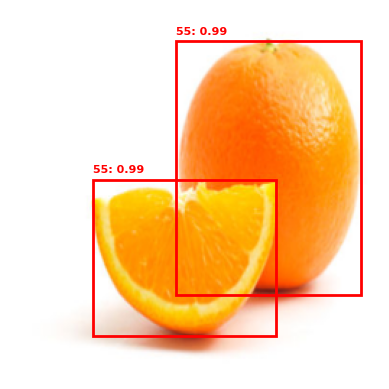

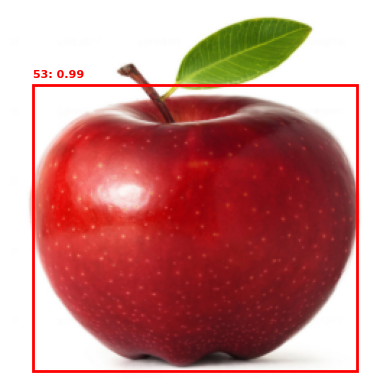

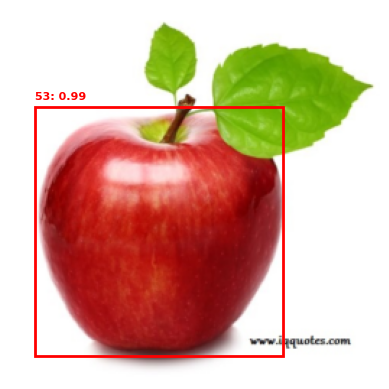

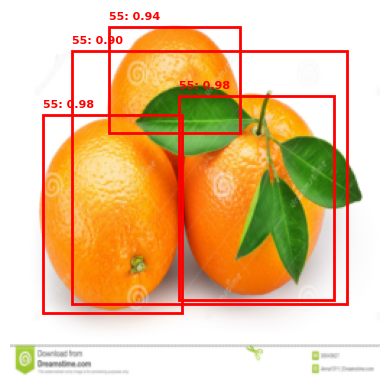

In [19]:
# Plot each image and its predictions
for i, prediction in enumerate(predictions):
  image = images[i]  # Original image
  boxes = prediction['boxes'].cpu().detach().numpy()
  labels = prediction['labels'].cpu().detach().numpy()
  scores = prediction['scores'].cpu().detach().numpy()
# Filter predictions by score threshold (e.g., 0.5)
  threshold = 0.65
  boxes = boxes[scores >= threshold]
  labels = labels[scores >= threshold]
  scores = scores[scores >= threshold]

            # Plot the image with bounding boxes
  plot_image_with_boxes(image, boxes, labels, scores)

## Yolo Model:

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 4.2 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 65.9MB/s]



image 1/1 /content/dataset_directory/test_zip/test/mixed_24.jpg: 384x640 1 banana, 2 apples, 85.1ms
Speed: 12.1ms preprocess, 85.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


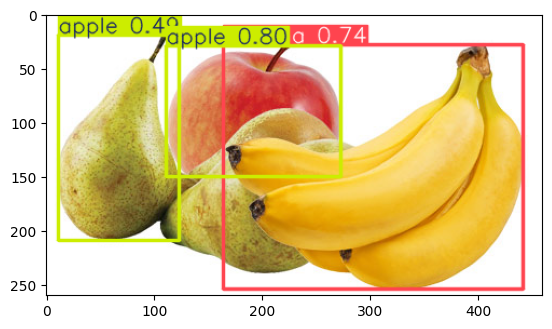

In [20]:
!pip install ultralytics

from ultralytics import YOLO

# Load a pretrained YOLOv8n model
model = YOLO('yolov8n.pt')

# Run inference on an image
results = model('/content/dataset_directory/test_zip/test/mixed_24.jpg')  # results list

import cv2
# Observe results
img = results[0].plot()
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [21]:
import os
import xml.etree.ElementTree as ET
from PIL import Image

# Define class names and a label map (adjust to your dataset's classes)
class_names = ['apple', 'banana', 'orange']  # Example classes
label_map = {name: idx for idx, name in enumerate(class_names)}

# YOLO folder structure
output_dir = '/content/yolo_dataset'
images_dir = os.path.join(output_dir, 'images')
labels_dir = os.path.join(output_dir, 'labels')
test_images_dir = os.path.join(output_dir, 'test_images')
test_labels_dir = os.path.join(output_dir, 'test_labels')

# Create necessary directories
os.makedirs(images_dir, exist_ok=True)
os.makedirs(labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)

# Path to original dataset
train_dataset_dir = '/content/dataset_directory/train_zip/train'  # Adjust to your dataset's path
test_dataset_dir = '/content/dataset_directory/test_zip/test'  # Adjust to your test dataset's path

def convert_bbox_yolo_format(bbox, img_width, img_height):
    """Convert bounding box to YOLO format."""
    xmin, ymin, xmax, ymax = bbox
    x_center = (xmin + xmax) / 2.0 / img_width
    y_center = (ymin + ymax) / 2.0 / img_height
    width = (xmax - xmin) / img_width
    height = (ymax - ymin) / img_height
    return x_center, y_center, width, height

def create_yolo_annotations(dataset_dir, images_dir, labels_dir):
    for filename in os.listdir(dataset_dir):
        if filename.endswith('.jpg'):
            # Copy image to images_dir
            img_path = os.path.join(dataset_dir, filename)
            img = Image.open(img_path)
            img_width, img_height = img.size

            # Convert image to RGB before saving
            img = img.convert('RGB')  # Convert to RGB format

            img.save(os.path.join(images_dir, filename))

            # Process corresponding XML annotation
            xml_path = os.path.splitext(img_path)[0] + '.xml'
            tree = ET.parse(xml_path)
            root = tree.getroot()

            yolo_annotations = []
            for obj in root.findall('object'):
                class_name = obj.find('name').text
                if class_name in label_map:
                    class_id = label_map[class_name]

                    # Get bounding box coordinates
                    bbox = obj.find('bndbox')
                    xmin = int(bbox.find('xmin').text)
                    ymin = int(bbox.find('ymin').text)
                    xmax = int(bbox.find('xmax').text)
                    ymax = int(bbox.find('ymax').text)

                    # Convert to YOLO format
                    x_center, y_center, width, height = convert_bbox_yolo_format(
                        (xmin, ymin, xmax, ymax), img_width, img_height
                    )
                    yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

            # Write YOLO annotations to .txt file
            label_file = os.path.join(labels_dir, os.path.splitext(filename)[0] + '.txt')
            with open(label_file, 'w') as f:
                f.write('\n'.join(yolo_annotations))

# Convert and structure the training dataset
create_yolo_annotations(train_dataset_dir, images_dir, labels_dir)

# Convert and structure the test dataset
create_yolo_annotations(test_dataset_dir, test_images_dir, test_labels_dir)

# Create the data.yaml file
yaml_content = f"""
path: {output_dir}
train: images  # Path to training images
val: images    # Path to validation images (can be same as train if no separate validation set)
test: test_images  # Path to test images
nc: {len(class_names)}
names: {class_names}
"""

with open(os.path.join(output_dir, 'data.yaml'), 'w') as yaml_file:
    yaml_file.write(yaml_content)

print("YOLO dataset structure and configuration file created.")


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


YOLO dataset structure and configuration file created.


In [22]:
model = YOLO('/content/yolo11n.pt')  # Load the pretrained YOLOv8n model

# Train the model on your dataset
model.train(data='/content/yolo_dataset/data.yaml', epochs=50, imgsz=640, batch=16)

100%|██████████| 5.35M/5.35M [00:00<00:00, 252MB/s]

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolo11n.pt, data=/content/yolo_dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

100%|██████████| 755k/755k [00:00<00:00, 79.3MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/yolo_dataset/labels... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<00:00, 1195.22it/s]

train: New cache created: /content/yolo_dataset/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolo_dataset/labels.cache... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.31G      1.177      3.012      1.514         71        640: 100%|██████████| 15/15 [00:06<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]

                   all        240        465    0.00635      0.983      0.436        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.24G       1.09      2.477      1.391         77        640: 100%|██████████| 15/15 [00:06<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.10it/s]


                   all        240        465    0.00714      0.994      0.574      0.384

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.24G       1.12      2.015      1.417         96        640: 100%|██████████| 15/15 [00:06<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.45it/s]


                   all        240        465      0.862      0.125      0.614      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.23G       1.12       1.72      1.414         65        640: 100%|██████████| 15/15 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]


                   all        240        465      0.728      0.411      0.673      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.24G      1.123      1.577        1.4         78        640: 100%|██████████| 15/15 [00:06<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.78it/s]

                   all        240        465      0.742      0.479      0.682      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.23G      1.081      1.543       1.38         65        640: 100%|██████████| 15/15 [00:03<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.77it/s]

                   all        240        465      0.664      0.614      0.724      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.24G      1.111      1.456      1.357         73        640: 100%|██████████| 15/15 [00:05<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

                   all        240        465      0.716      0.687      0.789      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.24G      1.097      1.413      1.369         68        640: 100%|██████████| 15/15 [00:03<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.99it/s]

                   all        240        465      0.747      0.739       0.78      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.24G      1.092      1.332      1.368         62        640: 100%|██████████| 15/15 [00:05<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.47it/s]

                   all        240        465      0.539      0.533      0.545      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.22G       1.08      1.282      1.356         62        640: 100%|██████████| 15/15 [00:03<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]

                   all        240        465      0.512      0.624      0.594      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.24G       1.09      1.306      1.365         83        640: 100%|██████████| 15/15 [00:06<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]


                   all        240        465      0.664      0.622      0.685      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.24G      1.002      1.154      1.271         73        640: 100%|██████████| 15/15 [00:03<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.92it/s]

                   all        240        465      0.776      0.746      0.826      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.24G      1.084      1.242      1.361         95        640: 100%|██████████| 15/15 [00:04<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        240        465      0.786      0.613       0.72      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.25G      1.045      1.214      1.317         80        640: 100%|██████████| 15/15 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.94it/s]

                   all        240        465      0.824      0.708      0.777      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.24G     0.9826      1.107      1.274         78        640: 100%|██████████| 15/15 [00:03<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.24it/s]

                   all        240        465      0.835       0.78       0.89       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.24G      1.027      1.115      1.304         66        640: 100%|██████████| 15/15 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.29it/s]

                   all        240        465      0.708      0.766      0.787       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.23G     0.9777      1.074      1.278         67        640: 100%|██████████| 15/15 [00:03<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.27it/s]

                   all        240        465      0.844      0.839      0.895      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.25G     0.9988      1.084      1.276         69        640: 100%|██████████| 15/15 [00:04<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]

                   all        240        465      0.823      0.877      0.917      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.24G     0.9845      1.041      1.287         62        640: 100%|██████████| 15/15 [00:03<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.36it/s]

                   all        240        465      0.865      0.892      0.926      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.24G     0.9683      1.025      1.262         72        640: 100%|██████████| 15/15 [00:05<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]

                   all        240        465       0.86      0.891      0.927      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.26G     0.9296     0.9272      1.238         85        640: 100%|██████████| 15/15 [00:03<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.16it/s]

                   all        240        465      0.889      0.885      0.947      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.24G     0.9295      0.929       1.23         80        640: 100%|██████████| 15/15 [00:05<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.78it/s]

                   all        240        465      0.902      0.893      0.941      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.22G     0.8935     0.9173      1.225         60        640: 100%|██████████| 15/15 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]

                   all        240        465      0.861      0.904      0.944      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.22G     0.9315     0.9286      1.244         78        640: 100%|██████████| 15/15 [00:07<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.37it/s]


                   all        240        465      0.867      0.854      0.948      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.23G     0.8775     0.9064      1.198         72        640: 100%|██████████| 15/15 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.01it/s]

                   all        240        465      0.839      0.857       0.93      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.25G     0.9073     0.9199      1.214         84        640: 100%|██████████| 15/15 [00:04<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]

                   all        240        465      0.913      0.917      0.961      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.24G     0.8823      0.875      1.212         67        640: 100%|██████████| 15/15 [00:04<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.18it/s]


                   all        240        465      0.934      0.919      0.974      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.24G     0.9052     0.8812      1.225         62        640: 100%|██████████| 15/15 [00:04<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]

                   all        240        465      0.932      0.926      0.972      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.24G     0.9077     0.8772      1.215         66        640: 100%|██████████| 15/15 [00:04<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.76it/s]

                   all        240        465      0.892      0.939       0.96      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.22G     0.8462     0.8583      1.175         92        640: 100%|██████████| 15/15 [00:03<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.53it/s]

                   all        240        465      0.902      0.934      0.959      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.24G     0.8674      0.856      1.209         71        640: 100%|██████████| 15/15 [00:05<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]

                   all        240        465      0.938      0.929      0.976      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.22G     0.8695     0.8449      1.198         48        640: 100%|██████████| 15/15 [00:03<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.70it/s]

                   all        240        465      0.917       0.95       0.98      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.24G     0.8095     0.8008      1.147         71        640: 100%|██████████| 15/15 [00:06<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]


                   all        240        465      0.939      0.955      0.983      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.22G     0.8165     0.8073      1.182         75        640: 100%|██████████| 15/15 [00:03<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.03it/s]


                   all        240        465      0.955      0.943      0.984      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.24G     0.8077     0.7846      1.166         74        640: 100%|██████████| 15/15 [00:05<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]


                   all        240        465      0.943      0.969      0.986      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.24G     0.7676     0.7474      1.134         74        640: 100%|██████████| 15/15 [00:03<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.25it/s]


                   all        240        465       0.95      0.966      0.988      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.23G     0.7981     0.7636      1.158         78        640: 100%|██████████| 15/15 [00:04<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.01it/s]

                   all        240        465      0.958      0.972      0.987       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.24G     0.7976     0.7706      1.142         76        640: 100%|██████████| 15/15 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]


                   all        240        465      0.956      0.969      0.986      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.24G     0.7721     0.7353      1.135         70        640: 100%|██████████| 15/15 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]

                   all        240        465      0.976      0.967      0.988       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.24G     0.7683     0.6988      1.125         91        640: 100%|██████████| 15/15 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.74it/s]


                   all        240        465      0.978      0.963      0.988      0.824
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.29G     0.7202     0.8673      1.124         40        640: 100%|██████████| 15/15 [00:06<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.00it/s]

                   all        240        465       0.97      0.959      0.986      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.24G     0.6808      0.749      1.116         23        640: 100%|██████████| 15/15 [00:03<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.06it/s]


                   all        240        465      0.985      0.937      0.985      0.825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       4.2G      0.658      0.748      1.088         39        640: 100%|██████████| 15/15 [00:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]

                   all        240        465      0.984      0.966      0.989      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       4.2G     0.6337     0.6588       1.06         22        640: 100%|██████████| 15/15 [00:04<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.94it/s]


                   all        240        465      0.984       0.97       0.99      0.842

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.23G     0.6639     0.6828      1.085         27        640: 100%|██████████| 15/15 [00:03<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.55it/s]

                   all        240        465      0.978      0.982      0.991      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       4.2G     0.6238     0.6526      1.057         27        640: 100%|██████████| 15/15 [00:05<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.61it/s]


                   all        240        465      0.978      0.989      0.993      0.847

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       4.2G     0.5905     0.6213      1.039         46        640: 100%|██████████| 15/15 [00:03<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.63it/s]


                   all        240        465      0.988      0.991      0.994      0.854

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.22G     0.5946     0.6224      1.024         31        640: 100%|██████████| 15/15 [00:06<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


                   all        240        465      0.991      0.984      0.991       0.86

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.23G     0.5866     0.6107      1.023         24        640: 100%|██████████| 15/15 [00:03<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


                   all        240        465       0.99      0.984      0.991       0.86

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       4.2G     0.5887     0.6025      1.038         34        640: 100%|██████████| 15/15 [00:06<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.26it/s]

                   all        240        465      0.988      0.985      0.992      0.859



50 epochs completed in 0.122 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.48it/s]


                   all        240        465      0.991      0.984      0.991       0.86
                 apple         90        156      0.981      0.994      0.994      0.878
                banana         92        169      0.994      0.959      0.985      0.826
                orange         91        140      0.998          1      0.995      0.875
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a28cc68be80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [23]:
results = model.val(data='/content/yolo_dataset/data.yaml')

# Print results
print(results)

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/yolo_dataset/labels.cache... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]


                   all        240        465       0.99      0.984      0.991      0.859
                 apple         90        156       0.98      0.994      0.994      0.876
                banana         92        169      0.994      0.958      0.985      0.828
                orange         91        140      0.997          1      0.995      0.875
Speed: 0.7ms preprocess, 15.8ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a28c72b56f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,  


image 1/1 /content/yolo_dataset/test_images/banana_86.jpg: 640x448 1 banana, 144.1ms
Speed: 9.0ms preprocess, 144.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 448)


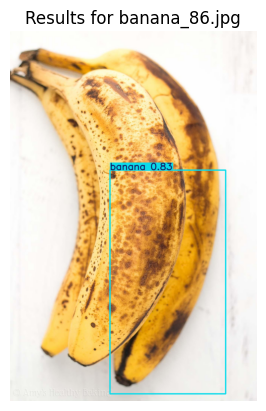


image 1/1 /content/yolo_dataset/test_images/banana_82.jpg: 448x640 1 banana, 225.4ms
Speed: 29.4ms preprocess, 225.4ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


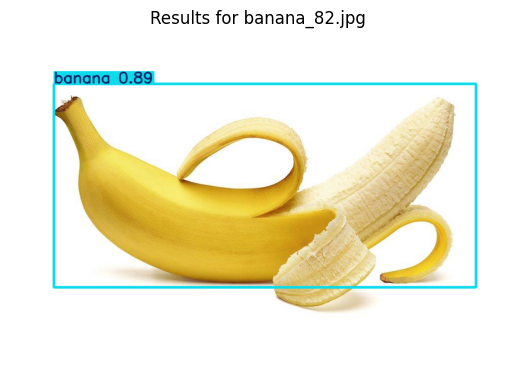


image 1/1 /content/yolo_dataset/test_images/banana_79.jpg: 416x640 1 banana, 98.0ms
Speed: 36.3ms preprocess, 98.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


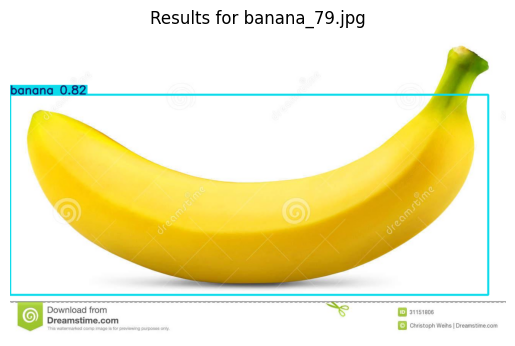


image 1/1 /content/yolo_dataset/test_images/banana_88.jpg: 480x640 1 banana, 98.6ms
Speed: 9.5ms preprocess, 98.6ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


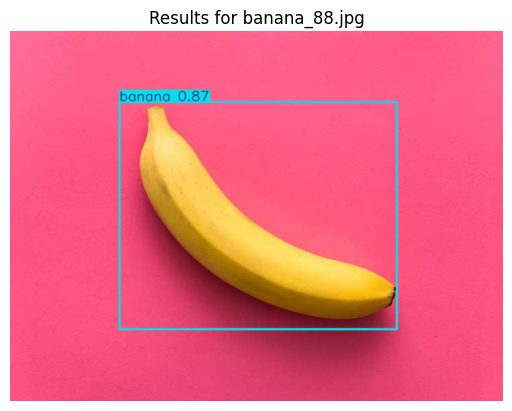


image 1/1 /content/yolo_dataset/test_images/banana_93.jpg: 640x640 2 bananas, 13.9ms
Speed: 4.1ms preprocess, 13.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


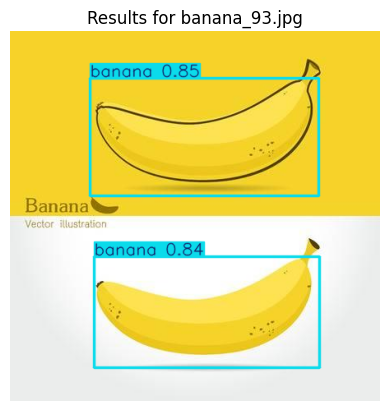


image 1/1 /content/yolo_dataset/test_images/orange_77.jpg: 480x640 3 oranges, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


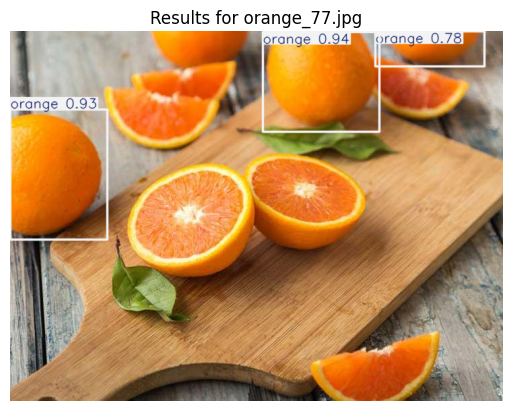


image 1/1 /content/yolo_dataset/test_images/apple_77.jpg: 512x640 6 apples, 114.1ms
Speed: 3.0ms preprocess, 114.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 640)


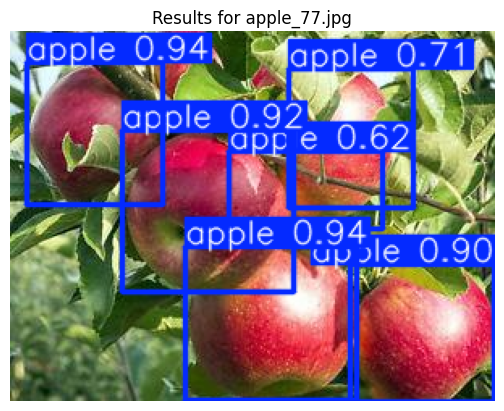


image 1/1 /content/yolo_dataset/test_images/apple_86.jpg: 448x640 3 apples, 15.6ms
Speed: 2.7ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


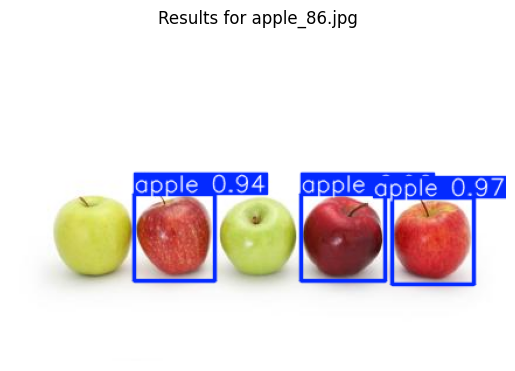


image 1/1 /content/yolo_dataset/test_images/orange_82.jpg: 640x640 1 orange, 57.3ms
Speed: 11.8ms preprocess, 57.3ms inference, 12.4ms postprocess per image at shape (1, 3, 640, 640)


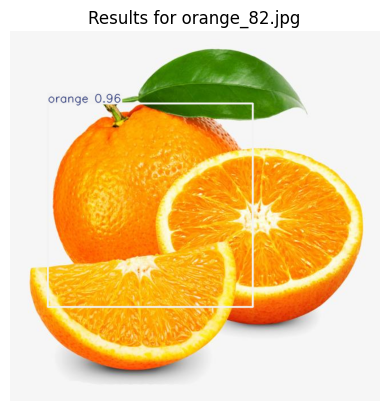


image 1/1 /content/yolo_dataset/test_images/apple_90.jpg: 640x608 1 apple, 136.1ms
Speed: 13.2ms preprocess, 136.1ms inference, 11.9ms postprocess per image at shape (1, 3, 640, 608)


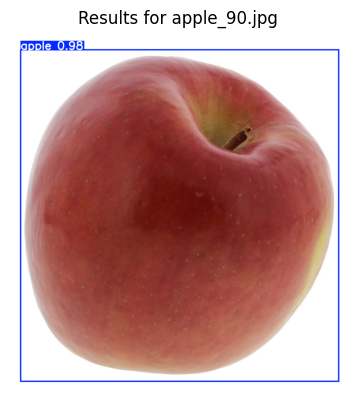


image 1/1 /content/yolo_dataset/test_images/orange_86.jpg: 480x640 2 oranges, 53.8ms
Speed: 4.9ms preprocess, 53.8ms inference, 7.0ms postprocess per image at shape (1, 3, 480, 640)


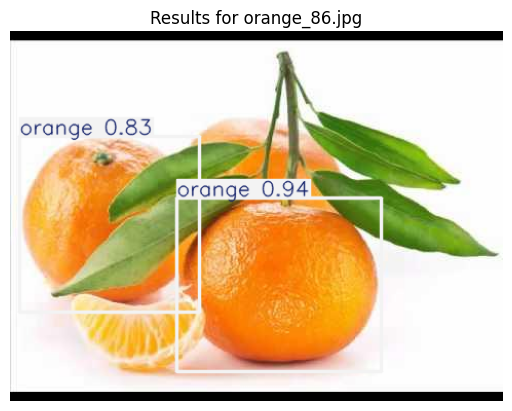


image 1/1 /content/yolo_dataset/test_images/banana_91.jpg: 448x640 3 bananas, 42.0ms
Speed: 19.4ms preprocess, 42.0ms inference, 6.7ms postprocess per image at shape (1, 3, 448, 640)


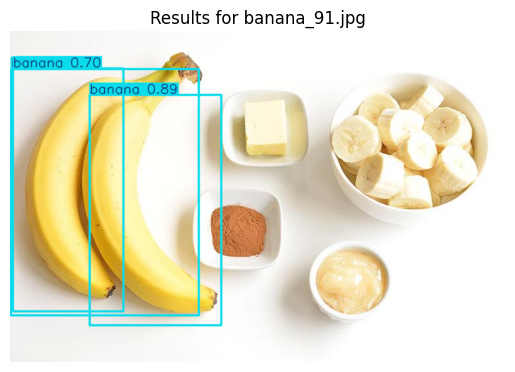


image 1/1 /content/yolo_dataset/test_images/apple_85.jpg: 512x640 1 apple, 30.7ms
Speed: 3.7ms preprocess, 30.7ms inference, 6.7ms postprocess per image at shape (1, 3, 512, 640)


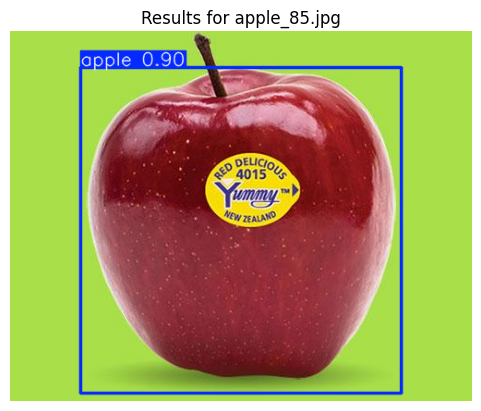


image 1/1 /content/yolo_dataset/test_images/orange_93.jpg: 448x640 2 oranges, 51.0ms
Speed: 2.6ms preprocess, 51.0ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


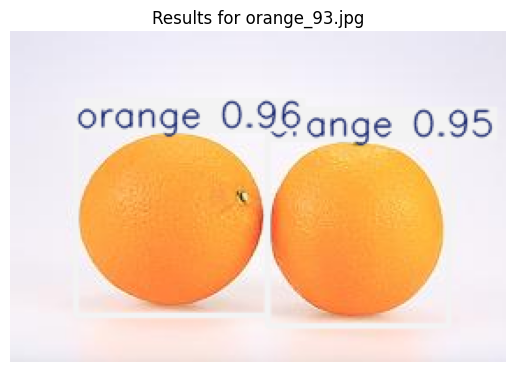


image 1/1 /content/yolo_dataset/test_images/apple_89.jpg: 640x576 1 apple, 150.4ms
Speed: 8.2ms preprocess, 150.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 576)


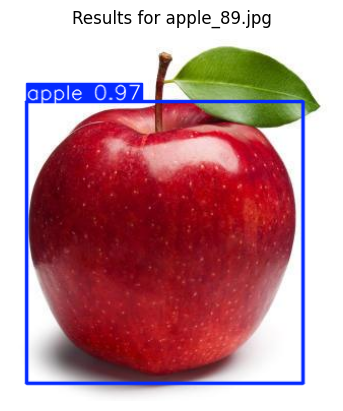


image 1/1 /content/yolo_dataset/test_images/orange_94.jpg: 576x640 1 orange, 325.2ms
Speed: 13.1ms preprocess, 325.2ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 640)


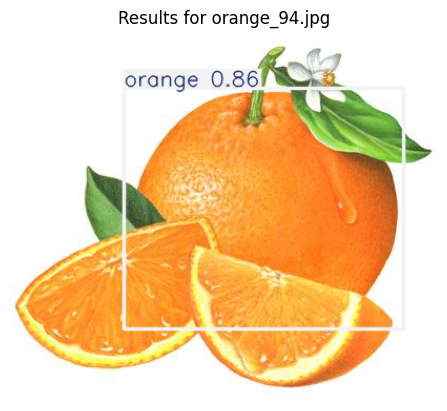


image 1/1 /content/yolo_dataset/test_images/apple_80.jpg: 544x640 1 apple, 99.3ms
Speed: 10.7ms preprocess, 99.3ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)


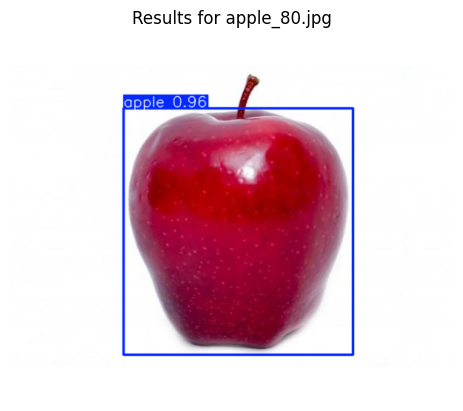


image 1/1 /content/yolo_dataset/test_images/orange_85.jpg: 640x480 1 orange, 221.6ms
Speed: 6.4ms preprocess, 221.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


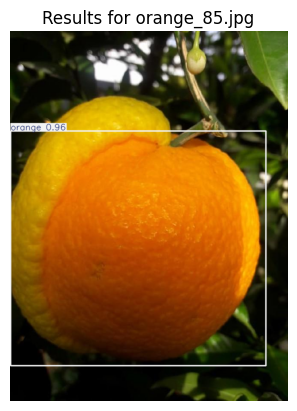


image 1/1 /content/yolo_dataset/test_images/banana_89.jpg: 640x640 3 bananas, 32.8ms
Speed: 5.7ms preprocess, 32.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


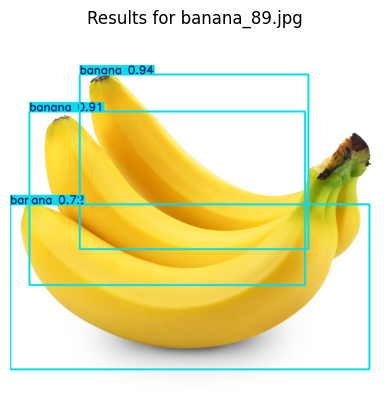


image 1/1 /content/yolo_dataset/test_images/banana_87.jpg: 256x640 5 bananas, 266.1ms
Speed: 5.2ms preprocess, 266.1ms inference, 7.6ms postprocess per image at shape (1, 3, 256, 640)


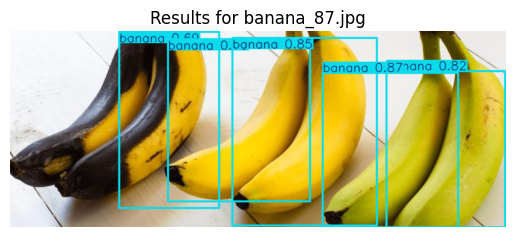


image 1/1 /content/yolo_dataset/test_images/apple_79.jpg: 640x640 1 apple, 43.2ms
Speed: 16.3ms preprocess, 43.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


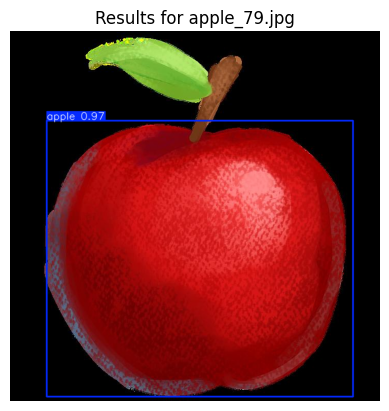


image 1/1 /content/yolo_dataset/test_images/banana_83.jpg: 384x640 3 bananas, 212.7ms
Speed: 14.0ms preprocess, 212.7ms inference, 11.5ms postprocess per image at shape (1, 3, 384, 640)


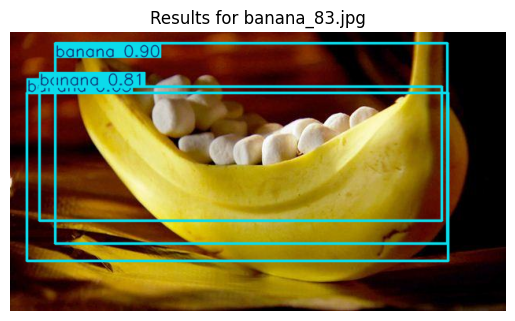


image 1/1 /content/yolo_dataset/test_images/orange_84.jpg: 512x640 1 orange, 55.9ms
Speed: 3.1ms preprocess, 55.9ms inference, 3.4ms postprocess per image at shape (1, 3, 512, 640)


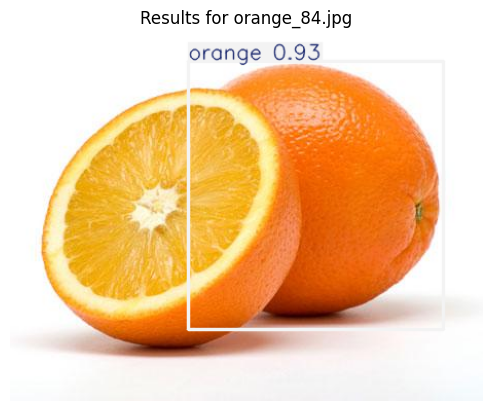


image 1/1 /content/yolo_dataset/test_images/mixed_22.jpg: 640x640 1 apple, 1 banana, 1 orange, 15.3ms
Speed: 4.7ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


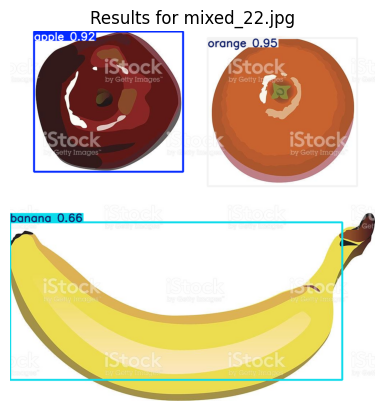


image 1/1 /content/yolo_dataset/test_images/banana_90.jpg: 384x640 3 bananas, 60.0ms
Speed: 8.4ms preprocess, 60.0ms inference, 13.9ms postprocess per image at shape (1, 3, 384, 640)


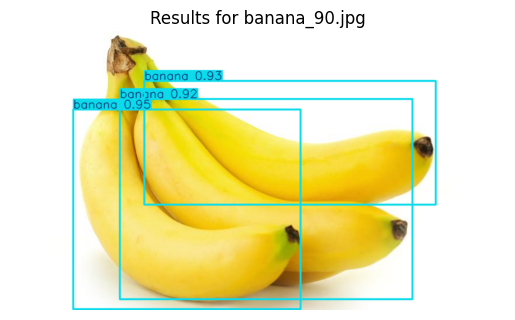


image 1/1 /content/yolo_dataset/test_images/orange_83.jpg: 640x640 1 orange, 28.0ms
Speed: 8.5ms preprocess, 28.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


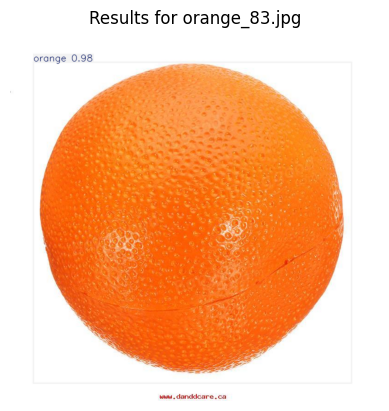


image 1/1 /content/yolo_dataset/test_images/apple_94.jpg: 448x640 4 apples, 21.3ms
Speed: 2.9ms preprocess, 21.3ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


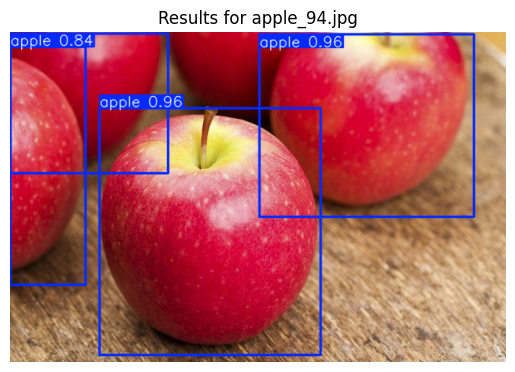


image 1/1 /content/yolo_dataset/test_images/mixed_23.jpg: 480x640 2 apples, 1 banana, 1 orange, 13.5ms
Speed: 4.0ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


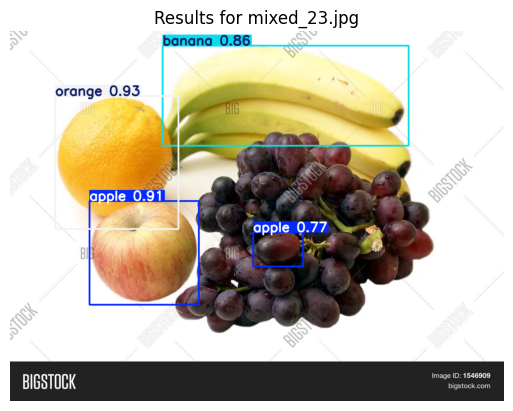


image 1/1 /content/yolo_dataset/test_images/mixed_21.jpg: 448x640 1 apple, 4 oranges, 12.9ms
Speed: 3.2ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


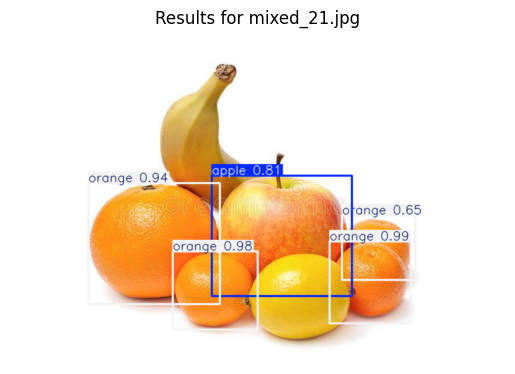


image 1/1 /content/yolo_dataset/test_images/orange_87.jpg: 640x640 2 oranges, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


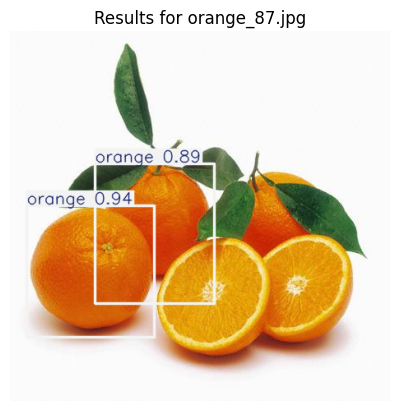


image 1/1 /content/yolo_dataset/test_images/apple_92.jpg: 640x640 1 apple, 11.7ms
Speed: 4.1ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


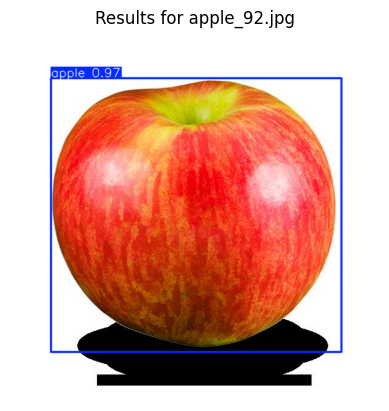


image 1/1 /content/yolo_dataset/test_images/apple_82.jpg: 640x576 1 apple, 13.6ms
Speed: 3.3ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 576)


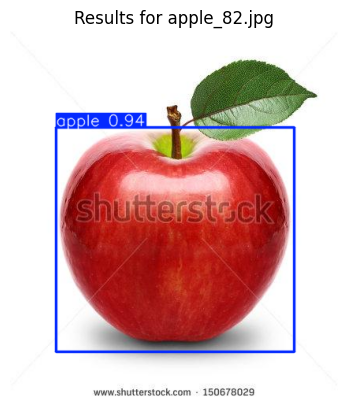


image 1/1 /content/yolo_dataset/test_images/orange_89.jpg: 480x640 3 oranges, 12.4ms
Speed: 3.8ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


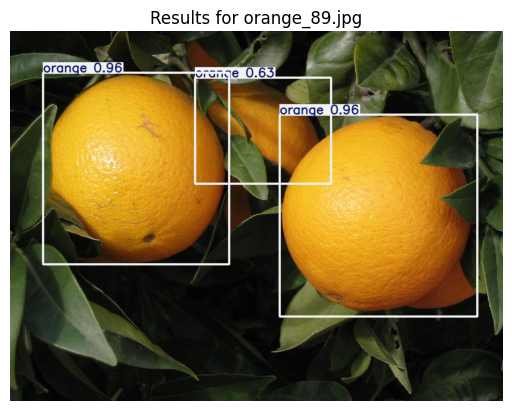


image 1/1 /content/yolo_dataset/test_images/orange_95.jpg: 640x640 1 orange, 16.9ms
Speed: 5.4ms preprocess, 16.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


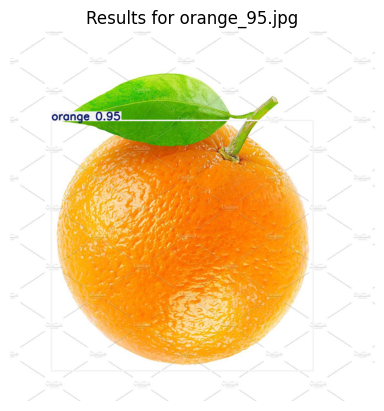


image 1/1 /content/yolo_dataset/test_images/banana_84.jpg: 384x640 1 banana, 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


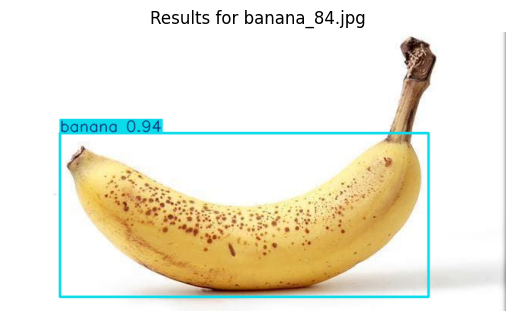


image 1/1 /content/yolo_dataset/test_images/mixed_25.jpg: 480x640 1 apple, 1 orange, 13.4ms
Speed: 2.9ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


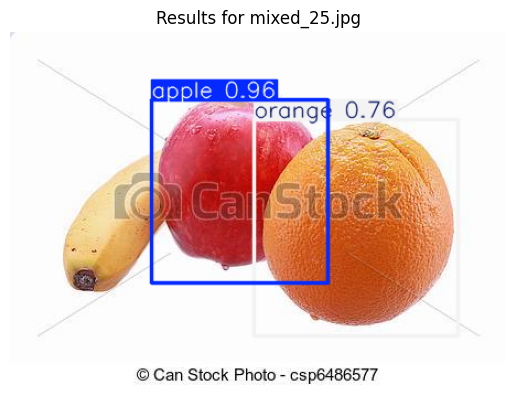


image 1/1 /content/yolo_dataset/test_images/orange_91.jpg: 544x640 1 orange, 13.3ms
Speed: 3.8ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 640)


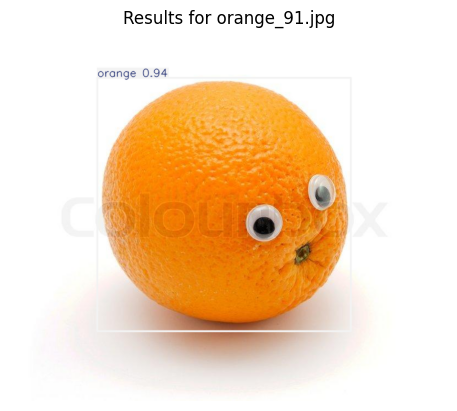


image 1/1 /content/yolo_dataset/test_images/banana_94.jpg: 576x640 (no detections), 15.6ms
Speed: 3.2ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 576, 640)


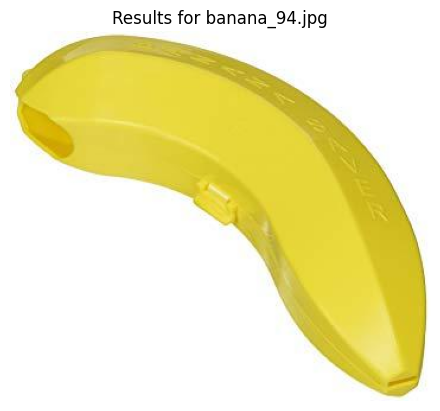


image 1/1 /content/yolo_dataset/test_images/banana_77.jpg: 640x544 1 banana, 77.4ms
Speed: 2.9ms preprocess, 77.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 544)


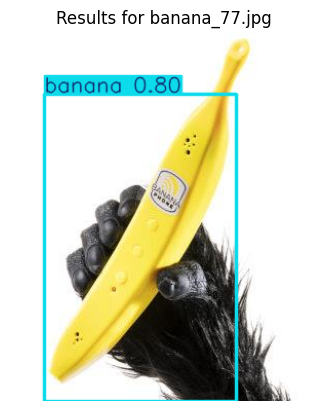


image 1/1 /content/yolo_dataset/test_images/banana_78.jpg: 640x640 1 banana, 14.5ms
Speed: 5.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


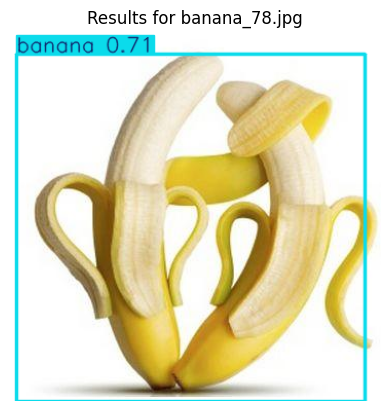


image 1/1 /content/yolo_dataset/test_images/orange_80.jpg: 480x640 1 orange, 12.6ms
Speed: 3.9ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


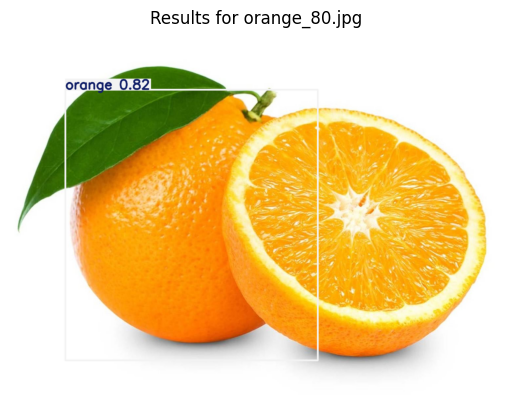


image 1/1 /content/yolo_dataset/test_images/apple_88.jpg: 640x640 (no detections), 16.5ms
Speed: 4.9ms preprocess, 16.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


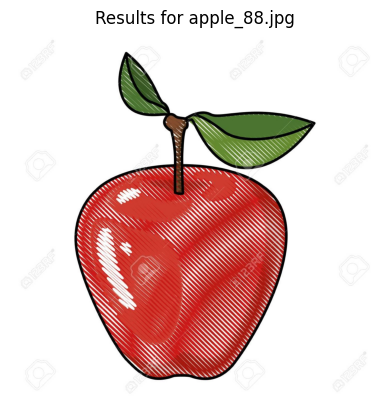


image 1/1 /content/yolo_dataset/test_images/banana_81.jpg: 480x640 2 bananas, 15.0ms
Speed: 3.2ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


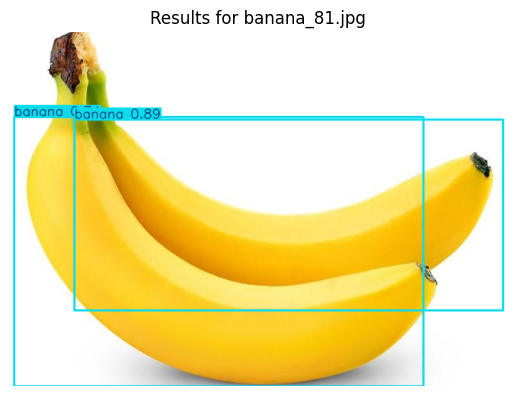


image 1/1 /content/yolo_dataset/test_images/apple_78.jpg: 640x640 1 apple, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


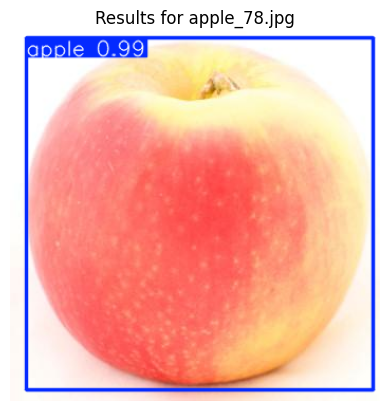


image 1/1 /content/yolo_dataset/test_images/apple_95.jpg: 416x640 4 apples, 25.3ms
Speed: 8.2ms preprocess, 25.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


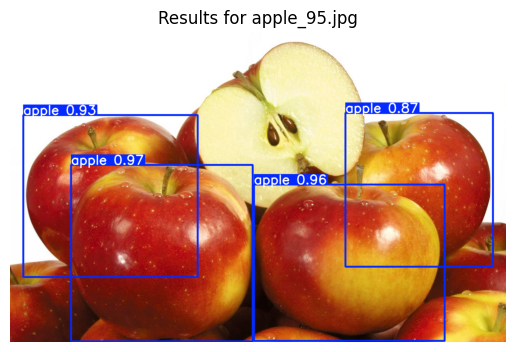


image 1/1 /content/yolo_dataset/test_images/orange_79.jpg: 640x640 4 oranges, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


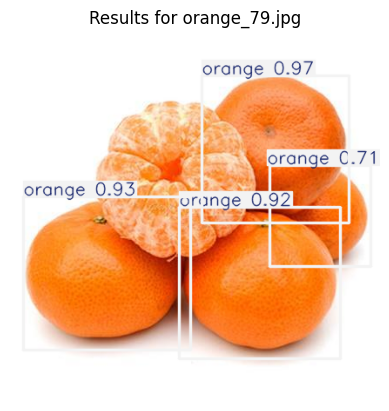


image 1/1 /content/yolo_dataset/test_images/banana_80.jpg: 640x640 (no detections), 12.2ms
Speed: 6.3ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


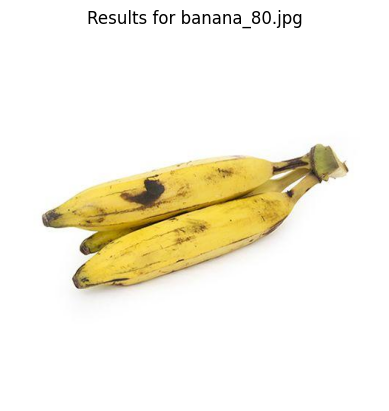


image 1/1 /content/yolo_dataset/test_images/mixed_24.jpg: 384x640 1 apple, 3 bananas, 19.5ms
Speed: 2.2ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


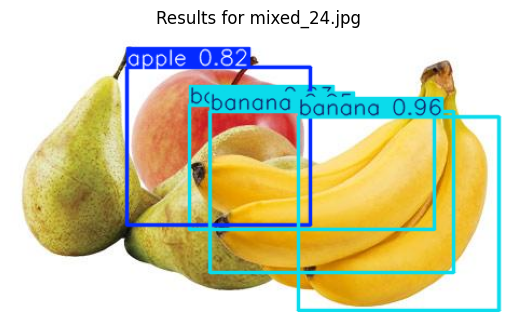


image 1/1 /content/yolo_dataset/test_images/banana_92.jpg: 640x640 1 banana, 16.0ms
Speed: 6.9ms preprocess, 16.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


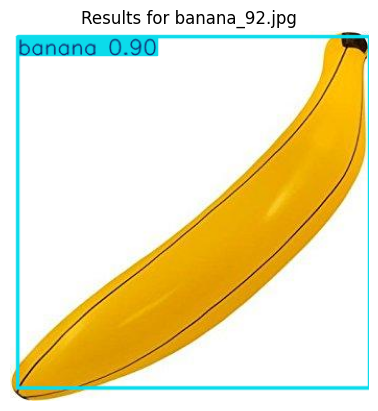


image 1/1 /content/yolo_dataset/test_images/apple_91.jpg: 384x640 1 apple, 19.1ms
Speed: 5.5ms preprocess, 19.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


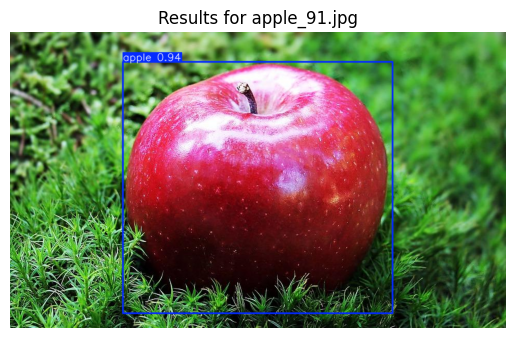


image 1/1 /content/yolo_dataset/test_images/orange_78.jpg: 320x640 1 orange, 68.3ms
Speed: 2.3ms preprocess, 68.3ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 640)


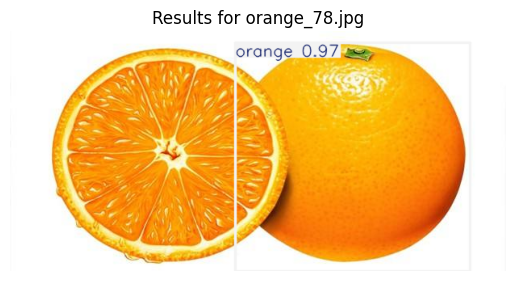


image 1/1 /content/yolo_dataset/test_images/apple_83.jpg: 608x640 1 apple, 74.1ms
Speed: 4.0ms preprocess, 74.1ms inference, 1.6ms postprocess per image at shape (1, 3, 608, 640)


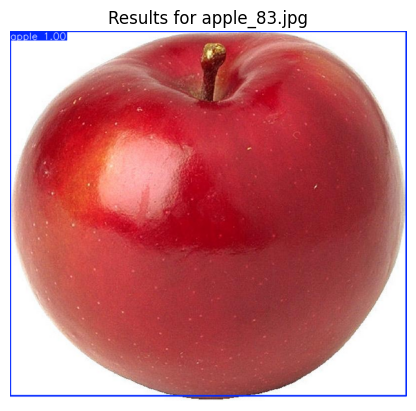


image 1/1 /content/yolo_dataset/test_images/orange_90.jpg: 512x640 4 oranges, 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


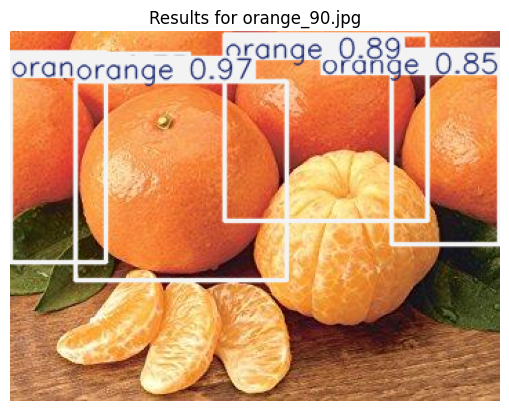


image 1/1 /content/yolo_dataset/test_images/apple_84.jpg: 448x640 3 apples, 16.9ms
Speed: 3.2ms preprocess, 16.9ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


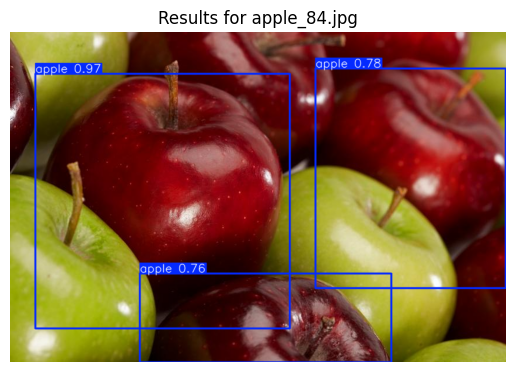


image 1/1 /content/yolo_dataset/test_images/apple_93.jpg: 448x640 1 apple, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


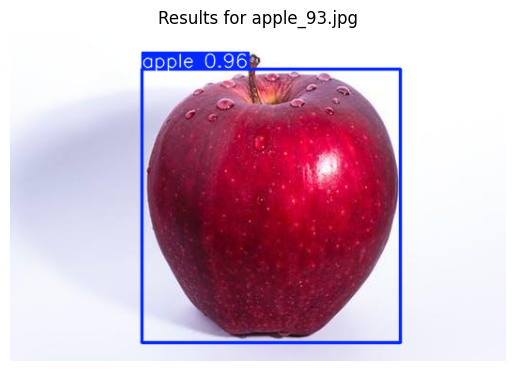


image 1/1 /content/yolo_dataset/test_images/banana_85.jpg: 384x640 1 banana, 16.6ms
Speed: 6.3ms preprocess, 16.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


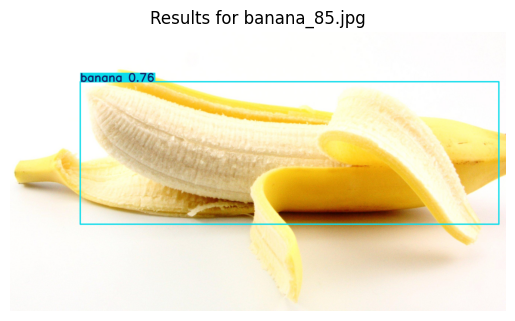


image 1/1 /content/yolo_dataset/test_images/orange_92.jpg: 448x640 1 orange, 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


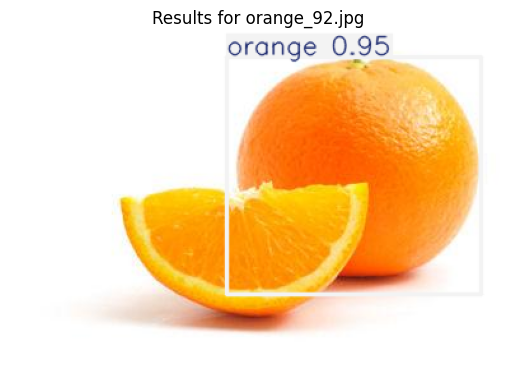


image 1/1 /content/yolo_dataset/test_images/apple_81.jpg: 640x576 1 apple, 15.4ms
Speed: 5.4ms preprocess, 15.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 576)


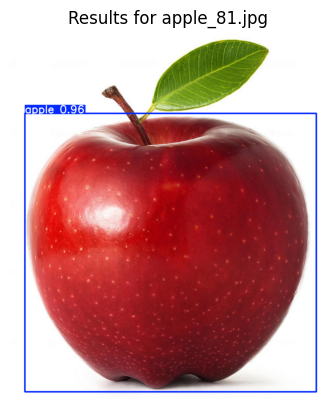


image 1/1 /content/yolo_dataset/test_images/apple_87.jpg: 640x640 1 apple, 21.1ms
Speed: 3.6ms preprocess, 21.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


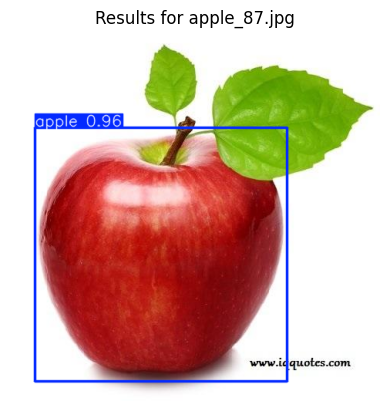


image 1/1 /content/yolo_dataset/test_images/orange_81.jpg: 512x640 3 oranges, 19.8ms
Speed: 8.9ms preprocess, 19.8ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


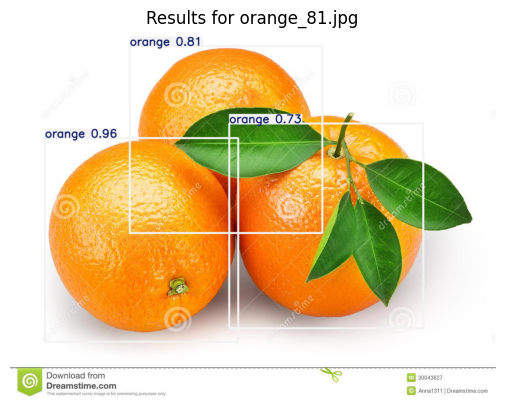

In [24]:
# Define the test images directory
test_images_dir = '/content/yolo_dataset/test_images'  # Path to your test images directory

# Loop through all images in the test directory
for img_file in os.listdir(test_images_dir):
    if img_file.endswith(('.jpg', '.png')):  # Check for valid image file types
        image_path = os.path.join(test_images_dir, img_file)
        results = model(image_path, conf = 0.6)  # Run inference

        # Plot the results
        img = results[0].plot()  # Get the plot image
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        plt.imshow(img)
        plt.title(f'Results for {img_file}')
        plt.axis('off')  # Hide axes
        plt.show()  # Display the image


In [25]:
results = model.val(data='/content/yolo_dataset/data.yaml', conf=0.6, iou=0.5)

# Print mAP results
mAP_0_5 = results.box.map50  # Assuming map50 attribute holds the mAP@0.5 value
mAP_0_5_0_95 = results.box.map   # Assuming map attribute holds the mAP@0.5:0.95 value

# Print mAP results
print("Mean Average Precision (mAP):")
print(f"mAP@0.5: {mAP_0_5:.4f}")
print(f"mAP@0.5:0.95: {mAP_0_5_0_95:.4f}")

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/yolo_dataset/labels.cache... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:06<00:00,  2.43it/s]


                   all        240        465      0.992       0.97      0.982      0.874
                 apple         90        156      0.981      0.994      0.994      0.896
                banana         92        169      0.994      0.917      0.958      0.832
                orange         91        140          1          1      0.995      0.895
Speed: 0.5ms preprocess, 5.6ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/train3
Mean Average Precision (mAP):
mAP@0.5: 0.9823
mAP@0.5:0.95: 0.8743
